# **Project Name -** Customer Segmentation & Churn Risk Analysis Using RFM-Based Exploratory Data Analysis


*   Project Type - EDA
*   Contribution - Individual
*   Member Name - Prayas Botake

#### **Project Summary**

This project performs Exploratory Data Analysis (EDA) on an e-commerce transactional dataset to understand customer purchasing behavior, identify high-value and at-risk customers, and support churn prediction using RFM (Recency, Frequency, Monetary) features.

The analysis focuses on transaction trends, customer segmentation, spending patterns, and behavioral signals that differentiate loyal customers from churn-prone ones. Quantile-based RFM scoring is used instead of arbitrary thresholds, making the segmentation more data-driven and scalable for real-world business use.

**GitHub Link:**

#### **Problem Statement**

The e-commerce business operates on a large volume of transactional data but lacks a systematic, data-driven understanding of customer value and retention risk. Currently, the business is unable to clearly identify:

* Customers who consistently contribute the highest revenue
* Customers showing early signs of churn based on declining engagement
* How purchasing behavior differs across recency, frequency, and monetary value

As a result, marketing and retention strategies are one-size-fits-all, leading to inefficient use of promotional budgets, missed upselling opportunities, and delayed churn intervention.

To address this, the business requires a structured customer segmentation framework using transactional behavior (RFM metrics) to:

* Differentiate high-value, loyal, and churn-prone customers
* Enable targeted marketing and retention actions
* Support early churn detection before revenue loss occurs

This project applies Exploratory Data Analysis combined with RFM-based segmentation to transform raw transaction data into actionable customer intelligence.



#### **Business Objectives**

* Understand customer purchasing behavior using transaction-level data

* Segment customers using RFM quantile rankings

* Identify high-value and loyal customers for retention and upselling

* Detect churn-risk customers based on recency and frequency patterns

* Provide actionable insights for marketing and customer engagement strategies

#### **Analytical Approach**

* Data cleaning & preprocessing

* Univariate analysis to understand distributions and outliers

* Bivariate & multivariate analysis to identify relationships

* RFM feature engineering using quantiles

* Customer segmentation based on RFM scores

* Churn vs non-churn behavior comparison

In [1]:
# Impoorting Libraries

# Core
import pandas as pd
import numpy as np
import datetime as dt

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


In [4]:
# Loading Dataset
df = pd.read_csv('rfm_ecommerce_data.csv')

### **Dataset Overview**

In [3]:
# First look of data
df.sample(5)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,date,Total,recency,Frequency,Monetary,r_quantile,f_quantile,m_quantile,rfm_quantile,Segmentation,target,target_variable
169198,539957,21668,RED STRIPE CERAMIC DRAWER KNOB,12,12/23/2010 12:58,1.25,12585.0,Germany,2010-12-23 12:58:00,15.00,233,2,2040.10,1,2,4,124,Big Spender,Non Churn,2
164897,547796,22328,ROUND SNACK BOXES SET OF 4 FRUITS,48,3/25/2011 12:34,2.55,14646.0,Netherlands,2011-03-25 12:34:00,122.40,1,74,280206.02,4,4,4,444,Best Customer,Non Churn,2
219254,572703,21810,CHRISTMAS HANGING STAR WITH BELL,9,10/25/2011 14:35,0.39,16110.0,United Kingdom,2011-10-25 14:35:00,3.51,44,3,1337.48,3,3,3,333,New Customer,Non Churn,2
265418,546784,22969,HOMEMADE JAM SCENTED CANDLES,12,3/17/2011 9:49,1.45,18189.0,United Kingdom,2011-03-17 09:49:00,17.40,77,2,1090.24,2,2,3,223,New Customer,Non Churn,2
194634,571106,23535,WALL ART BICYCLE SAFETY,2,10/13/2011 16:14,5.95,14976.0,United Kingdom,2011-10-13 16:14:00,11.90,56,7,790.86,2,4,3,243,Loyal Customer,Non Churn,2


In [4]:
df.shape

(397924, 20)

There are 397924 rows and 20 columns

In [5]:
#checking all the columns in our dataset
df.columns.values

array(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'date', 'Total', 'recency',
       'Frequency', 'Monetary', 'r_quantile', 'f_quantile', 'm_quantile',
       'rfm_quantile', 'Segmentation', 'target', 'target_variable'],
      dtype=object)

## **Dataset Information**
* InvoiceNo - There are 397924 Unique identifiers for transactions.
* StockCode - A unique identifier for each product.
* Description - A textual description of the product.
* Quantity - The number of units of the product purchased in the transaction.
* InvoiceDate - The date and time when the transaction occurred.
* UnitPrice - The price of a single unit of the product.
* CustomerID - A unique identifier for the customer who made the purchase.
* Country - The country where the customer transaction took place
* date - The date of the transaction
* Total - The total cost of the items in that transaction row (Quantity × UnitPrice).
* recency - The number of days since the customer's last purchase.
* Frequency - How often the customer has made purchases.
* Monetary - The total amount of money spent by the customer.
* r_quantile -The quantile rank for the customer's recency.
* f_quantile - The quantile rank for the customer's frequency.
* m_quantile - The quantile rank for the customer's monetary value.
* rfm_quantile - A combined score or identifier based on the R, F, and M quantiles.
* Segmentation - The category assigned to the customer based on their RFM scores (e.g., "Loyal Customer", "New Customer", "Best Customer").
* target - A label indicating customer behavior, such as "Non Churn".
* target_variable - A numerical representation of the target label.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 397924 entries, 0 to 397923
Data columns (total 20 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   InvoiceNo        397924 non-null  int64  
 1   StockCode        397924 non-null  object 
 2   Description      397924 non-null  object 
 3   Quantity         397924 non-null  int64  
 4   InvoiceDate      397924 non-null  object 
 5   UnitPrice        397924 non-null  float64
 6   CustomerID       397924 non-null  float64
 7   Country          397924 non-null  object 
 8   date             397924 non-null  object 
 9   Total            397924 non-null  float64
 10  recency          397924 non-null  int64  
 11  Frequency        397924 non-null  int64  
 12  Monetary         397924 non-null  float64
 13  r_quantile       397924 non-null  int64  
 14  f_quantile       397924 non-null  int64  
 15  m_quantile       397924 non-null  int64  
 16  rfm_quantile     397924 non-null  int6

There are 9 int64 dtype columns, 4 float64 dtype columns, 7 object dtype columns

### **Data Cleaning And Preparation**

In [7]:
# Standardized column names
df.columns = (
df.columns.str.strip().str.replace(' ', '_').str.replace('-', '_'))


In [ ]:
# Updated DataFrame
df.head(2)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,date,Total,recency,Frequency,Monetary,r_quantile,f_quantile,m_quantile,rfm_quantile,Segmentation,target,target_variable
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,2010-12-01 08:26:00,15.30,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2


The columns names are Standardized

In [9]:
# Checking Null Values 
df.isnull().sum()

InvoiceNo          0
StockCode          0
Description        0
Quantity           0
InvoiceDate        0
UnitPrice          0
CustomerID         0
Country            0
date               0
Total              0
recency            0
Frequency          0
Monetary           0
r_quantile         0
f_quantile         0
m_quantile         0
rfm_quantile       0
Segmentation       0
target             0
target_variable    0
dtype: int64

There is no null value in the dataset.

In [10]:
null_values =  df.isnull().sum().reset_index().rename({'index' : 'column_names' , 0:'total_null_values'},axis=1)
null_values

,column_names,total_null_values
0,InvoiceNo,0
1,StockCode,0
2,Description,0
3,Quantity,0
4,InvoiceDate,0
5,UnitPrice,0
6,CustomerID,0
7,Country,0
8,date,0
9,Total,0


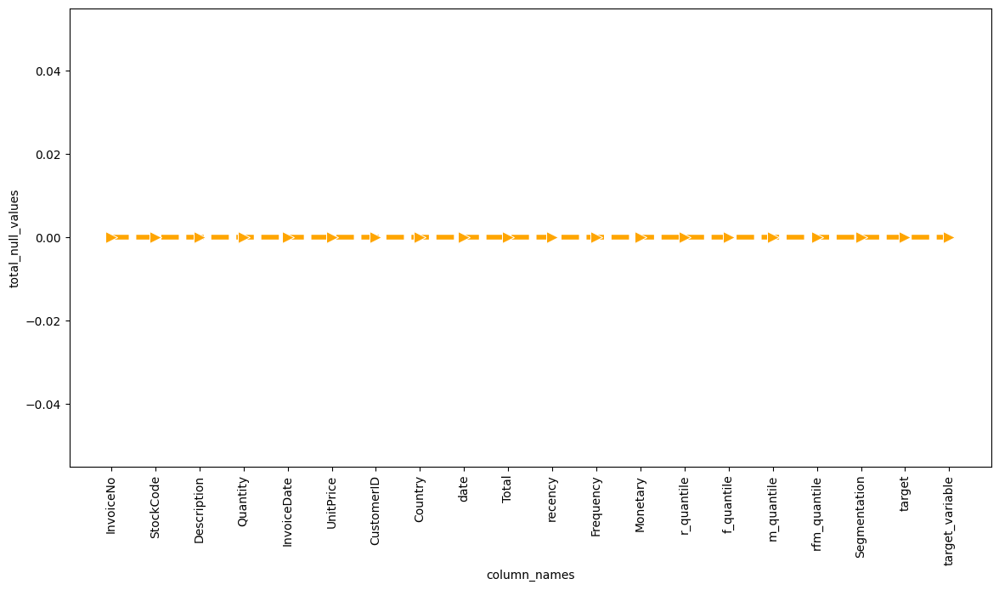

In [11]:
plt.figure(figsize=(14,7))
sns.lineplot(x = null_values['column_names'], y = null_values['total_null_values'], linestyle='--', marker='>',color = 'orange',linewidth=4,markersize=10 )
plt.xticks(rotation = 90)
plt.show()

In [12]:
# Checking duplicates
df[df.duplicated()]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,date,Total,recency,Frequency,Monetary,r_quantile,f_quantile,m_quantile,rfm_quantile,Segmentation,target,target_variable
948,545290,77101A,UNION FLAG WINDSOCK,1,3/1/2011 12:01,1.25,14688.0,United Kingdom,2011-03-01 12:01:00,1.25,7,21,5630.87,4,4,4,444,Best Customer,Non Churn,2
1062,560791,23182,TOILET SIGN OCCUPIED OR VACANT,24,7/21/2011 10:30,0.83,14688.0,United Kingdom,2011-07-21 10:30:00,19.92,7,21,5630.87,4,4,4,444,Best Customer,Non Churn,2
1134,580256,22467,GUMBALL COAT RACK,12,12/2/2011 12:24,2.55,14688.0,United Kingdom,2011-12-02 12:24:00,30.60,7,21,5630.87,4,4,4,444,Best Customer,Non Churn,2
1289,537195,22775,PURPLE DRAWERKNOB ACRYLIC EDWARDIAN,12,12/5/2010 13:55,1.25,15311.0,United Kingdom,2010-12-05 13:55:00,15.00,0,91,60767.90,4,4,4,444,Best Customer,Non Churn,2
1368,538857,21731,RED TOADSTOOL LED NIGHT LIGHT,1,12/14/2010 13:58,1.65,15311.0,United Kingdom,2010-12-14 13:58:00,1.65,0,91,60767.90,4,4,4,444,Best Customer,Non Churn,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397757,581142,22533,MAGIC DRAWING SLATE BAKE A CAKE,5,12/7/2011 13:38,0.42,14204.0,United Kingdom,2011-12-07 13:38:00,2.10,1,1,161.03,4,1,1,411,New Customer,Non Churn,2
397782,581149,22107,PIZZA PLATE IN BOX,1,12/7/2011 14:12,1.25,15471.0,United Kingdom,2011-12-07 14:12:00,1.25,1,1,469.48,4,1,2,412,New Customer,Non Churn,2
397797,581149,21446,12 RED ROSE PEG PLACE SETTINGS,2,12/7/2011 14:12,1.25,15471.0,United Kingdom,2011-12-07 14:12:00,2.50,1,1,469.48,4,1,2,412,New Customer,Non Churn,2
397830,581149,71053,WHITE MOROCCAN METAL LANTERN,1,12/7/2011 14:12,3.75,15471.0,United Kingdom,2011-12-07 14:12:00,3.75,1,1,469.48,4,1,2,412,New Customer,Non Churn,2


In [13]:
# Total Duplicates Row
len(df[df.duplicated()])

5192

There are 5192 duplicates rows in the dataset.

In [14]:
# Removing Duplicates
df = df.drop_duplicates()


In [ ]:
# Updated DataFrame
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,date,Total,recency,Frequency,Monetary,r_quantile,f_quantile,m_quantile,rfm_quantile,Segmentation,target,target_variable
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,2010-12-01 08:26:00,15.30,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,2010-12-01 08:26:00,22.00,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2


After removing duplicate rows, 392732 records remain in the dataset.

In [17]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,date,Total,recency,Frequency,Monetary,r_quantile,f_quantile,m_quantile,rfm_quantile,Segmentation,target,target_variable
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,2010-12-01 08:26:00,15.30,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,2010-12-01 08:26:00,22.00,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,Non Churn,2


From above description we can see that there is one column i.e target we can convert it into  catogorical to integer column by replacing 'Churn'   with '1' and 'No Churn' and 'No Use' with '0'.

In [18]:
df=df.drop(columns=['target_variable'])

In [19]:

df['target']=(df['target'].replace({'Churn':1,'Non Churn':0,'No Use':0})).astype(int)


C:\Users\P\AppData\Local\Temp\ipykernel_26408\2648349300.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['target']=(df['target'].replace({'Churn':1,'Non Churn':0,'No Use':0})).astype(int)


In [ ]:
# Updated DataFrame
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,date,Total,recency,Frequency,Monetary,r_quantile,f_quantile,m_quantile,rfm_quantile,Segmentation,target
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,2010-12-01 08:26:00,15.30,371,34,5391.21,1,4,4,144,Loyal Customer,0
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,2010-12-01 08:26:00,22.00,371,34,5391.21,1,4,4,144,Loyal Customer,0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,2010-12-01 08:26:00,20.34,371,34,5391.21,1,4,4,144,Loyal Customer,0


In [21]:
# Feature Categorization
Numerical_features=df.select_dtypes(['int','float'])
Categorical_features=df.select_dtypes(['object'])

In [22]:
len(Numerical_features.columns)

13

After separating the numerical features from the original dataset, 13 columns were identified.

In [23]:
len(Categorical_features.columns)

6

After separating categorical features from the original dataset, 6 categorical columns  were identified

### **Univariate analysis**
*   This form of analysis is for analysing single variable
*   Analyzing one feature at a time

In [24]:
df.describe()

,InvoiceNo,Quantity,UnitPrice,CustomerID,Total,recency,Frequency,Monetary,r_quantile,f_quantile,m_quantile,rfm_quantile,target
count,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000
mean,560591.072436,13.153718,3.125596,15287.734822,22.629195,40.112660,18.804126,11604.652591,3.233014,3.323215,3.452815,359.986355,0.003987
std,13087.116747,181.588420,22.240725,1713.567773,311.083465,65.402982,37.360483,31467.025264,0.970170,0.948626,0.852910,103.235501,0.063020
min,536365.000000,1.000000,0.000000,12346.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,111.000000,0.000000
25%,549234.000000,2.000000,1.250000,13955.000000,4.950000,3.000000,3.000000,1111.790000,3.000000,3.000000,3.000000,322.000000,0.000000
50%,561874.000000,6.000000,1.950000,15150.000000,12.390000,15.000000,7.000000,2674.480000,4.000000,4.000000,4.000000,432.000000,0.000000
75%,572061.000000,12.000000,3.750000,16791.000000,19.800000,42.000000,15.000000,6292.260000,4.000000,4.000000,4.000000,444.000000,0.000000
max,581587.000000,80995.000000,8142.750000,18287.000000,168469.600000,373.000000,210.000000,280206.020000,4.000000,4.000000,4.000000,444.000000,1.000000


The wide gap between the mean and median values for Recency, Frequency, and Monetary indicates skewed customer behavior. 
This further validates the use of quantile-based segmentation instead of raw values.


In [25]:
RFM=[ 'recency','Frequency', 'Monetary']

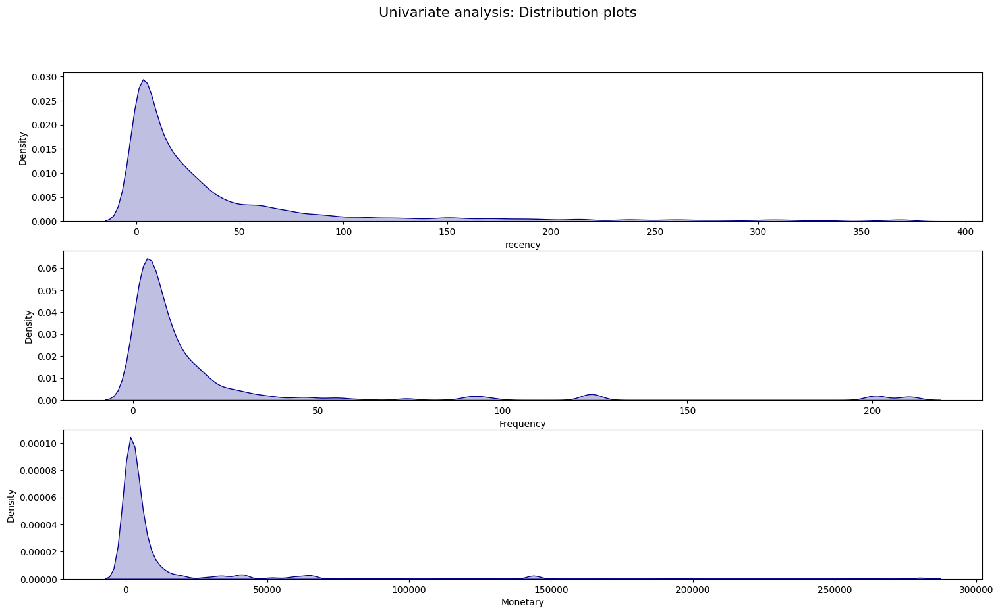

In [26]:
plt.figure(figsize=(18,10))
plt.suptitle('Univariate analysis: Distribution plots', fontsize=15)
for i in range(0, len(RFM)):
  plt.subplot(3,1,i+1)
  sns.kdeplot(x=df[RFM[i]],fill=True,color='darkblue')

**Recency**
* Customers with higher recency values are more likely to churn, as a longer gap since the last purchase often reflects declining engagement.

**Frequency**
* Customers with higher purchase frequency demonstrate stronger engagement and are less likely to churn.

**Monetary**
* Retaining high-spending customers is crucial, as churn from this segment can lead to a significant revenue loss despite their smaller population size.



In [12]:
a=df['Description'].value_counts().reset_index().rename(columns={'Description':'Product','count':'Total_Transcations'}).head(10)
a

,Product,Total_Transcations
0,WHITE HANGING HEART T-LIGHT HOLDER,2028
1,REGENCY CAKESTAND 3 TIER,1724
2,JUMBO BAG RED RETROSPOT,1618
3,ASSORTED COLOUR BIRD ORNAMENT,1408
4,PARTY BUNTING,1397
5,LUNCH BAG RED RETROSPOT,1316
6,SET OF 3 CAKE TINS PANTRY DESIGN,1159
7,LUNCH BAG BLACK SKULL.,1105
8,POSTAGE,1099
9,PACK OF 72 RETROSPOT CAKE CASES,1068


In [6]:
plt.figure(figsize=(14,7))
fig=px.bar(data_frame=a,x='Product',y='Total_Orders',title='Total Transcations By Product')
fig.update_layout(xaxis_tickangle=45)



<Figure size 1400x700 with 0 Axes>

Here WHITE HANGING HEART T-LIGHT HOLDER dominant the total transactions

In [9]:
b=df['Country'].value_counts().reset_index().rename(columns={'Country':'Country','count':'Total_Transcations'}).head(10)
b

,Country,Total_Transcations
0,United Kingdom,354345
1,Germany,9042
2,France,8342
3,EIRE,7238
4,Spain,2485
5,Netherlands,2363
6,Belgium,2031
7,Switzerland,1842
8,Portugal,1462
9,Australia,1185


In [11]:
plt.figure(figsize=(14,7))
fig=px.bar(data_frame=b,x='Country',y='Total_Transcations',title='Total Transcations By Country')
fig.update_layout(xaxis_tickangle=45)

<Figure size 1400x700 with 0 Axes>

United Kingdom is dominant the transcations.

### **Bivariate analysisi**

In [31]:
plt.figure(figsize=(14,7))
px.treemap(data_frame=df, path=['Segmentation'], values='CustomerID')

<Figure size 1400x700 with 0 Axes>

The majority of the customer transactions belong to the "Best Customer" and "New Customer" segments.
"DeadBeats" and "Lost Customers" make up the smallest portion of the data.

In [32]:
df['InvoiceDate']=pd.to_datetime(df['InvoiceDate'])

In [33]:
df['InvoiceDate']=pd.to_datetime(df['InvoiceDate'])


In [34]:
df['Month']=df['InvoiceDate'].dt.month_name()

In [78]:
df['Month_Num']=df['InvoiceDate'].dt.month

In [79]:
Monthly_Rev=df.groupby(['Month_Num','Month'])['Total'].sum().reset_index().sort_values(by='Month_Num',ascending=True)
Monthly_Rev

,Month_Num,Month,Total
0,1,January,568101.310
1,2,February,446084.920
2,3,March,594081.760
3,4,April,468374.331
4,5,May,677355.150
5,6,June,660046.050
6,7,July,598962.901
7,8,August,644051.040
8,9,September,950690.202
9,10,October,1035642.450


In [80]:
plt.figure(figsize=(14,7))
px.line(data_frame=Monthly_Rev,x='Month',y='Total',markers='o',title='Monthly Revenue')

<Figure size 1400x700 with 0 Axes>

Monthly revenue shows a clear upward trend toward the end of the year, with strong growth from September to November.

In [38]:
df['Day_Of_Week'] = df['InvoiceDate'].dt.day_name()

In [39]:
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday','Saturday', 'Sunday'] 

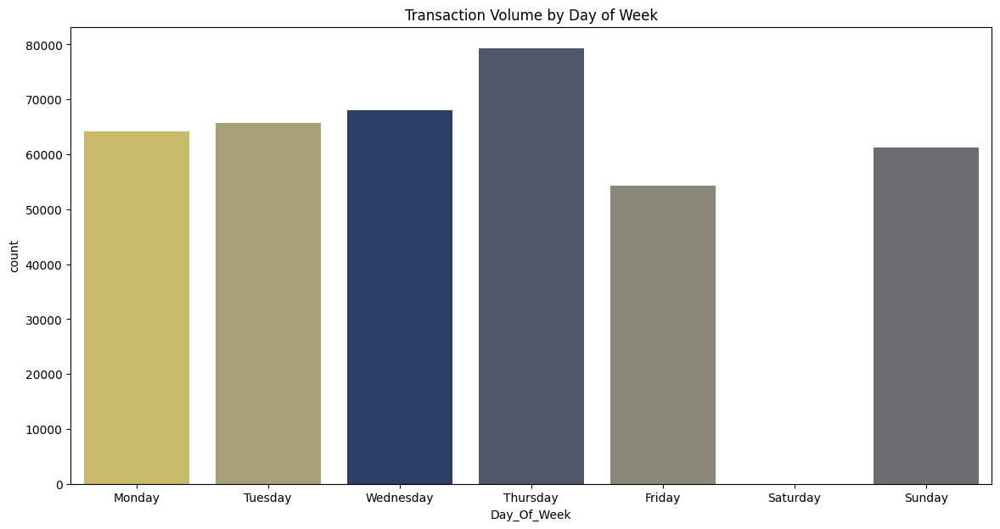

In [40]:
plt.figure(figsize=(14,7))
sns.countplot(data=df,x=df['Day_Of_Week'],order=day_order,palette="cividis",hue='Day_Of_Week')
plt.title('Transaction Volume by Day of Week')
plt.show()

Transaction volumes peak during the mid-week period (Tuesday to Thursday). 
Notably, Saturday records are absent from the dataset, indicating that Saturdays are likely official non-working days.

In [41]:
Top_product= df.groupby('Description')['Total'].sum().sort_values(ascending=False).head(10)
Top_product.head(10)

Description
PAPER CRAFT , LITTLE BIRDIE           168469.60
REGENCY CAKESTAND 3 TIER              142264.75
WHITE HANGING HEART T-LIGHT HOLDER    100392.10
JUMBO BAG RED RETROSPOT                85040.54
MEDIUM CERAMIC TOP STORAGE JAR         81416.73
POSTAGE                                77803.96
PARTY BUNTING                          68785.23
ASSORTED COLOUR BIRD ORNAMENT          56413.03
Manual                                 53419.93
RABBIT NIGHT LIGHT                     51251.24
Name: Total, dtype: float64

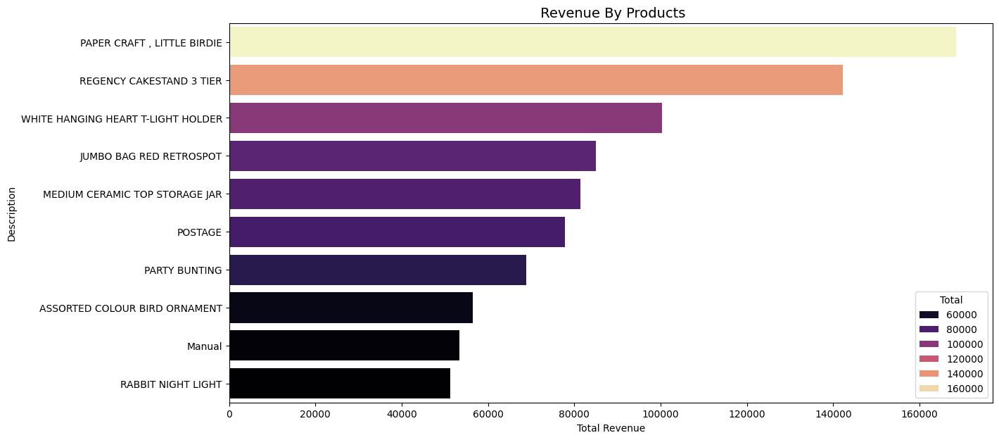

In [42]:
plt.figure(figsize=(14, 7))
sns.barplot(x=Top_product.values, y=Top_product.index, palette='magma',hue=Top_product)
plt.title(' Revenue By Products', fontsize=14)
plt.xlabel('Total Revenue')
plt.show()


Top 2 products PAPER CRAFT, LITTLE BIRDIE and REGENCY CAKESTAND 3 TIER dominate revenue.

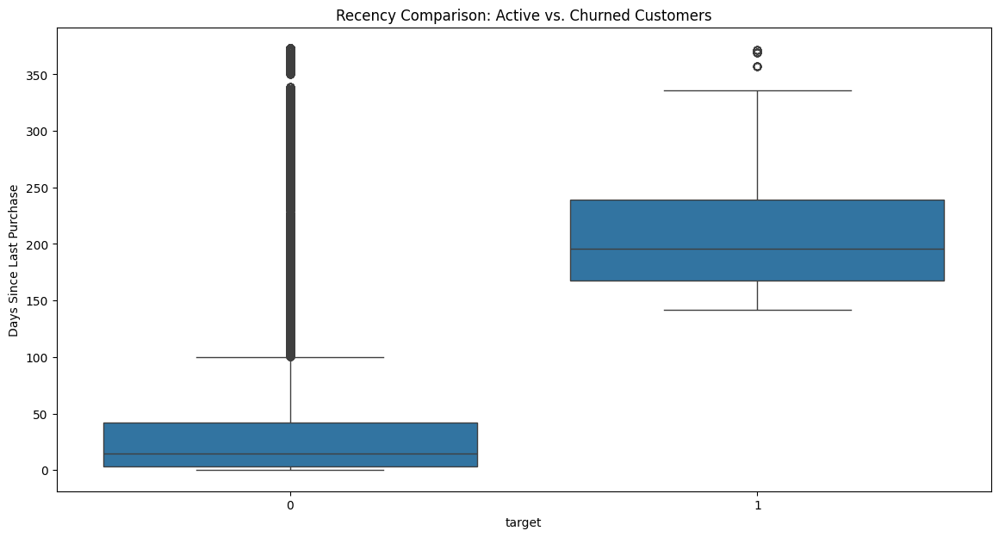

In [43]:
plt.figure(figsize=(14, 7))
sns.boxplot(data=df, x='target', y='recency')
plt.title('Recency Comparison: Active vs. Churned Customers')
plt.ylabel('Days Since Last Purchase')
plt.show()

In [44]:
# segmentation vs. Recency
plt.figure(figsize=(14,7))
px.box(data_frame=df,x=df['Segmentation'],y=df['recency'],color='Segmentation',title='Recency Distribution by Customer Segment')

<Figure size 1400x700 with 0 Axes>

In [45]:
# Top 10 Countries by Revenue
Top_Country=df.groupby(df['Country'])['Total'].sum().reset_index().sort_values(by='Total', ascending=False).head(10)
Top_Country


,Country,Total
35,United Kingdom,7285024.644
23,Netherlands,285446.340
10,EIRE,265262.460
14,Germany,228678.400
13,France,208934.310
0,Australia,138453.810
30,Spain,61558.560
32,Switzerland,56443.950
3,Belgium,41196.340
31,Sweden,38367.830


In [46]:
plt.figure(figsize=(14,7))
px.bar(data_frame=Top_Country,x=Top_Country['Country'],y=Top_Country['Total'],title='Total Revenue By Country')

<Figure size 1400x700 with 0 Axes>

The United Kingdom is the dominant market, accounting for the vast majority of the total revenue.

### **Multivariate Analysis**

In [47]:
x = df[['Quantity', 'UnitPrice', 'Total', 'recency', 'Frequency', 'Monetary']]
corelation=x.corr()
corelation

,Quantity,UnitPrice,Total,recency,Frequency,Monetary
Quantity,1.000000,-0.004577,0.908873,-0.001181,0.007144,0.058981
UnitPrice,-0.004577,1.000000,0.081620,0.006846,0.002356,0.009412
Total,0.908873,0.081620,1.000000,-0.002230,0.008104,0.069042
recency,-0.001181,0.006846,-0.002230,1.000000,-0.235145,-0.181352
Frequency,0.007144,0.002356,0.008104,-0.235145,1.000000,0.604212
Monetary,0.058981,0.009412,0.069042,-0.181352,0.604212,1.000000


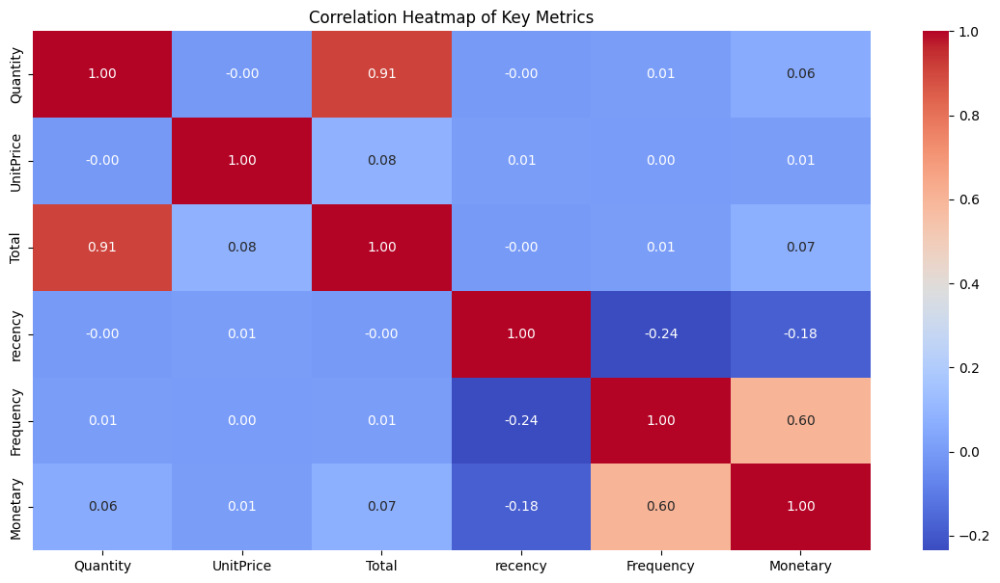

In [48]:
plt.figure(figsize=(14, 7))
sns.heatmap(corelation, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Key Metrics')
plt.show()

In [ ]:
# Frequency vs. Monetary 
plt.figure(figsize=(14,7))
fig=px.scatter(data_frame=df,x=df['Frequency'],y=df['Monetary'],color='Segmentation',title='Frequency vs Monetary by segment')
fig.update_yaxes(type='log')
fig.update_xaxes(type='log')
fig.show()

<Figure size 1400x700 with 0 Axes>

This scatter plot reveals distinct clusters. Best Customers are located in the top-right quadrant (High Frequency, High Monetary), while Big Spenders might have high monetary value but lower frequency. New Customers are clustered in the bottom-left, showing lower values for both.

#### **Final Conclusion**
* Customer spending is highly skewed, with a small segment contributing a large share of revenue

* Recency and Frequency are stronger churn indicators than Monetary alone
 
* Loyal and Best customers show high frequency and low recency, while churn-risk customers show long inactivity gaps

* Quantile-based RFM scoring provides balanced and interpretable segmentation

* The dataset is well-suited for churn modeling, not just EDA

#### **Business Recommendations**

* Retention campaigns for high-recency, low-frequency customers

*Loyalty programs & exclusive offers for Best and Loyal segments

* Re-engagement emails or discounts for churn-risk customers

* Focus marketing spend on high-frequency customers instead of one-time buyers

* Use RFM features as direct inputs to a churn prediction model (Logistic / Tree-based)